<a href="https://colab.research.google.com/github/PacktPublishing/Hands-On-Computer-Vision-with-PyTorch/blob/master/Chapter12/Face_generation_using_Conditional_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Inmplementing conditional GANs
So far we have trained a GAN on celebA that includes faces with various attributes.
Then, the generation process we sample a noise and then generate an image without controlling the attributes
The question is : can we control the attributes ? (e.g. man vs woman, with or without glasses etc)  

We can do it with conditional GAN. lets try to control man/woman: 

The strategy we adopt is as follows:
1. Specify the label of the image we want to generate as a one-hot-encoded version.
2. Pass the label through an embedding layer to generate a multi-dimensional representation of each class.
3. Generate random noise and concatenate with the embedding layer generated in the previous step.
4. Train the model just like we did in the previous sections, but this time with the noise vector concatenated with the embedding of the class of image we wish to generate.  


A comparison between the GAN and cGAN is summarized in the following figure:

![img](Comparison-between-GAN-and-conditional-GAN.png)



Note that the condition y can be fed as one hot encoding of the label or an embedding of the label.
in the following implementation, we let the generator and discriminator use their own embedding layer.



In [ ]:
# already downloaded. no need to redo it.
# !wget https://www.dropbox.com/s/rbajpdlh7efkdo1/male_female_face_images.zip
# !unzip -q male_female_face_images.zip

In [1]:
# !pip install -q --upgrade torch_snippets
from torch_snippets import *
device = "cuda" if torch.cuda.is_available() else "cpu"
from torchvision.utils import make_grid
from torch_snippets import *
from PIL import Image
import torchvision
from torchvision import transforms
import torchvision.utils as vutils

In [2]:
female_images = Glob('./females/*.jpg')
male_images = Glob('./males/*.jpg')

In [3]:
print(f'we have {len(female_images)} female images')
print(f'we have {len(male_images)} male images')

we have 14688 female images
we have 13948 male images


Ensure that we crop the images so that we retain only faces and discard additional details in an image.  
we'll use the cascade filter to detect face images and crop them : 

In [4]:
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

In [5]:
# !mkdir cropped_faces_female
# !mkdir cropped_faces_male
n_cropped_female=0
for i in tqdm.notebook.tqdm(range(len(female_images))):
    img = read(female_images[i],1)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    for (x,y,w,h) in faces:
        n_cropped_female+=1
        img2 = img[y:(y+h),x:(x+w),:]
        cv2.imwrite('cropped_faces_female/'+str(i)+'.jpg',cv2.cvtColor(img2, cv2.COLOR_RGB2BGR))
print(f'scanned {len(female_images)} female images and found {n_cropped_female} faces')
n_cropped_male = 0 
for i in tqdm.notebook.tqdm(range(len(male_images))):
    img = read(male_images[i],1)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    for (x,y,w,h) in faces:
        n_cropped_male += 1
        img2 = img[y:(y+h),x:(x+w),:]
        cv2.imwrite('cropped_faces_male/'+str(i)+'.jpg',cv2.cvtColor(img2, cv2.COLOR_RGB2BGR))
print(f'scanned {len(male_images)} male images and found {n_cropped_male} faces')

TypeError: 'module' object is not callable

In [6]:
# specify the transformation to perform on each image
transform=transforms.Compose([
                               transforms.Resize(64),
                               transforms.CenterCrop(64),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ])

Note that the following dataset class is not as we did before.
- we didnt specify the transform in `self.transform` as we call it by ourselves
- we dont use collate_fn that probably make it slower to run  


is there a reason why its implemented this way ?

In [7]:
class Faces(Dataset):
    def __init__(self, folders):
        super().__init__()
        self.folderfemale = folders[0]
        self.foldermale = folders[1]
        self.images=sorted(Glob(self.folderfemale))+sorted(Glob(self.foldermale))
    def __len__(self):
        return len(self.images)
    def __getitem__(self, ix):
        image_path = self.images[ix]
        image = Image.open(image_path)
        image = transform(image)
        gender = np.where('female' in str(image_path),1,0)
        return image, torch.tensor(gender).long()

In [8]:
ds = Faces(folders=['cropped_faces_female','cropped_faces_male'])
dataloader = DataLoader(ds, batch_size=64, shuffle=True, num_workers=8)

In [9]:
len(ds)

27299

In [ ]:
img,lbl = ds[21432]
print(lbl)
show(img)

Define the weight initialization method (just like we did in the DCGAN section) so that we do not have a widespread variation across randomly initialized weight values:

In [10]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

building the discrimnator model

<font color='red'> **Note** in the original version, we basically couldnt change the embedding size. need to change it so that model2 is adapted to emb_size. </font>

In [11]:
class Discriminator(nn.Module):
    def __init__(self, emb_size=32):
        super(Discriminator, self).__init__()
        self.emb_size = 32
        self.label_embeddings = nn.Embedding(2, self.emb_size)
        self.model = nn.Sequential(
            nn.Conv2d(3,64,4,2,1,bias=False),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64,64*2,4,2,1,bias=False),
            nn.BatchNorm2d(64*2),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64*2,64*4,4,2,1,bias=False),
            nn.BatchNorm2d(64*4),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64*4,64*8,4,2,1,bias=False),
            nn.BatchNorm2d(64*8),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64*8,64,4,2,1,bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Flatten()
        )
        self.model2 = nn.Sequential(
            # nn.Linear(288,100),
            nn.Linear(256+self.emb_size,100),   # my fix to adapt to emb_size
            nn.LeakyReLU(0.2,inplace=True),
            nn.Linear(100,1),
            nn.Sigmoid()
        )
        self.apply(weights_init)
    def forward(self, input, labels):
        x = self.model(input)
        y = self.label_embeddings(labels)
        input = torch.cat([x, y], 1)
        final_output = self.model2(input)
        return final_output

In [12]:
# !pip install torch_summary
from torchsummary import summary
discriminator = Discriminator().to(device)
summary(discriminator,torch.zeros(32,3,64,64).to(device), torch.zeros(32).long().to(device));

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 256]                 --
|    └─Conv2d: 2-1                       [-1, 64, 32, 32]          3,072
|    └─LeakyReLU: 2-2                    [-1, 64, 32, 32]          --
|    └─Conv2d: 2-3                       [-1, 128, 16, 16]         131,072
|    └─BatchNorm2d: 2-4                  [-1, 128, 16, 16]         256
|    └─LeakyReLU: 2-5                    [-1, 128, 16, 16]         --
|    └─Conv2d: 2-6                       [-1, 256, 8, 8]           524,288
|    └─BatchNorm2d: 2-7                  [-1, 256, 8, 8]           512
|    └─LeakyReLU: 2-8                    [-1, 256, 8, 8]           --
|    └─Conv2d: 2-9                       [-1, 512, 4, 4]           2,097,152
|    └─BatchNorm2d: 2-10                 [-1, 512, 4, 4]           1,024
|    └─LeakyReLU: 2-11                   [-1, 512, 4, 4]           --
|    └─Conv2d: 2-12                      [-1, 64, 2, 2]     

note that the noise dimenstion is 100

In [13]:
class Generator(nn.Module):
    def __init__(self, emb_size=32):
        super(Generator,self).__init__()
        self.emb_size = emb_size
        self.label_embeddings = nn.Embedding(2, self.emb_size)
        self.model = nn.Sequential(
            nn.ConvTranspose2d(100+self.emb_size,64*8,4,1,0,bias=False),
            nn.BatchNorm2d(64*8),
            nn.ReLU(True),
            nn.ConvTranspose2d(64*8,64*4,4,2,1,bias=False),
            nn.BatchNorm2d(64*4),
            nn.ReLU(True),
            nn.ConvTranspose2d(64*4,64*2,4,2,1,bias=False),
            nn.BatchNorm2d(64*2),
            nn.ReLU(True),
            nn.ConvTranspose2d(64*2,64,4,2,1,bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64,3,4,2,1,bias=False),
            nn.Tanh()
        )
        self.apply(weights_init)
    def forward(self,input_noise,labels):
        label_embeddings = self.label_embeddings(labels).view(len(labels), self.emb_size, 1, 1)
        input = torch.cat([input_noise, label_embeddings], 1)
        return self.model(input)

In [14]:
generator = Generator().to(device)
summary(generator,torch.zeros(32,100,1,1).to(device), torch.zeros(32).long().to(device))

Layer (type:depth-idx)                   Output Shape              Param #
├─Embedding: 1-1                         [-1, 32]                  64
├─Sequential: 1-2                        [-1, 3, 64, 64]           --
|    └─ConvTranspose2d: 2-1              [-1, 512, 4, 4]           1,081,344
|    └─BatchNorm2d: 2-2                  [-1, 512, 4, 4]           1,024
|    └─ReLU: 2-3                         [-1, 512, 4, 4]           --
|    └─ConvTranspose2d: 2-4              [-1, 256, 8, 8]           2,097,152
|    └─BatchNorm2d: 2-5                  [-1, 256, 8, 8]           512
|    └─ReLU: 2-6                         [-1, 256, 8, 8]           --
|    └─ConvTranspose2d: 2-7              [-1, 128, 16, 16]         524,288
|    └─BatchNorm2d: 2-8                  [-1, 128, 16, 16]         256
|    └─ReLU: 2-9                         [-1, 128, 16, 16]         --
|    └─ConvTranspose2d: 2-10             [-1, 64, 32, 32]          131,072
|    └─BatchNorm2d: 2-11                 [-1, 64, 32, 32

Layer (type:depth-idx)                   Output Shape              Param #
├─Embedding: 1-1                         [-1, 32]                  64
├─Sequential: 1-2                        [-1, 3, 64, 64]           --
|    └─ConvTranspose2d: 2-1              [-1, 512, 4, 4]           1,081,344
|    └─BatchNorm2d: 2-2                  [-1, 512, 4, 4]           1,024
|    └─ReLU: 2-3                         [-1, 512, 4, 4]           --
|    └─ConvTranspose2d: 2-4              [-1, 256, 8, 8]           2,097,152
|    └─BatchNorm2d: 2-5                  [-1, 256, 8, 8]           512
|    └─ReLU: 2-6                         [-1, 256, 8, 8]           --
|    └─ConvTranspose2d: 2-7              [-1, 128, 16, 16]         524,288
|    └─BatchNorm2d: 2-8                  [-1, 128, 16, 16]         256
|    └─ReLU: 2-9                         [-1, 128, 16, 16]         --
|    └─ConvTranspose2d: 2-10             [-1, 64, 32, 32]          131,072
|    └─BatchNorm2d: 2-11                 [-1, 64, 32, 32

In [15]:
def noise(size):
    n = torch.randn(size, 100, 1, 1, device=device)
    return n.to(device)

In [16]:
def discriminator_train_step(real_data, real_labels, fake_data, fake_labels):
    d_optimizer.zero_grad()
    prediction_real = discriminator(real_data, real_labels)
    error_real = loss(prediction_real, torch.ones(len(real_data), 1).to(device))
    error_real.backward()
    prediction_fake = discriminator(fake_data, fake_labels)
    error_fake = loss(prediction_fake, torch.zeros(len(fake_data), 1).to(device))
    error_fake.backward()
    d_optimizer.step()    
    return error_real + error_fake

In [17]:
def generator_train_step(fake_data, fake_labels):
    g_optimizer.zero_grad()
    prediction = discriminator(fake_data, fake_labels)
    error = loss(prediction, torch.ones(len(fake_data), 1).to(device))
    error.backward()
    g_optimizer.step()
    return error

In [18]:
discriminator = Discriminator().to(device)
generator = Generator().to(device)
loss = nn.BCELoss()
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
fixed_noise = torch.randn(64, 100, 1, 1, device=device)
fixed_fake_labels = torch.LongTensor([0]*(len(fixed_noise)//2) + [1]*(len(fixed_noise)//2)).to(device)
loss = nn.BCELoss()
n_epochs = 25
img_list = []

EPOCH: 1.000	d_loss: 0.653	g_loss: 2.494	(38.13s - 915.02s remaining)


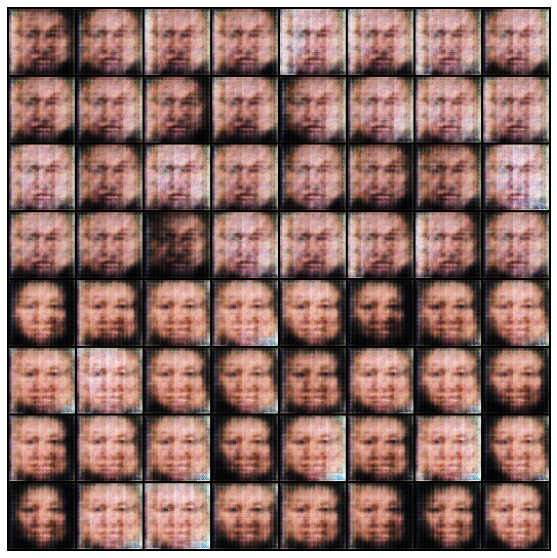

EPOCH: 2.000	d_loss: 0.613	g_loss: 3.469	(78.23s - 899.69s remaining)


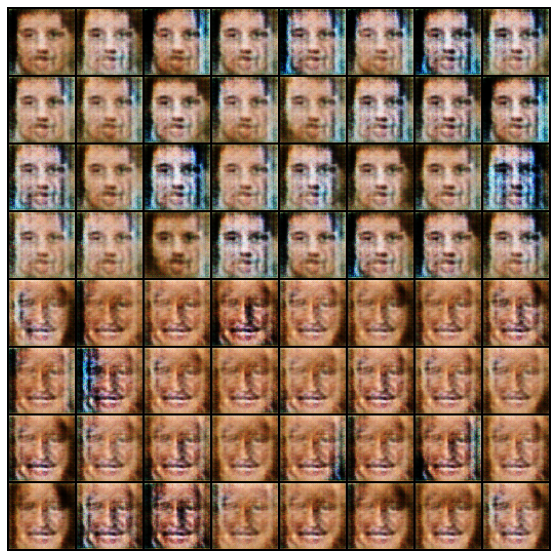

EPOCH: 3.000	d_loss: 0.448	g_loss: 4.269	(120.32s - 882.34s remaining)


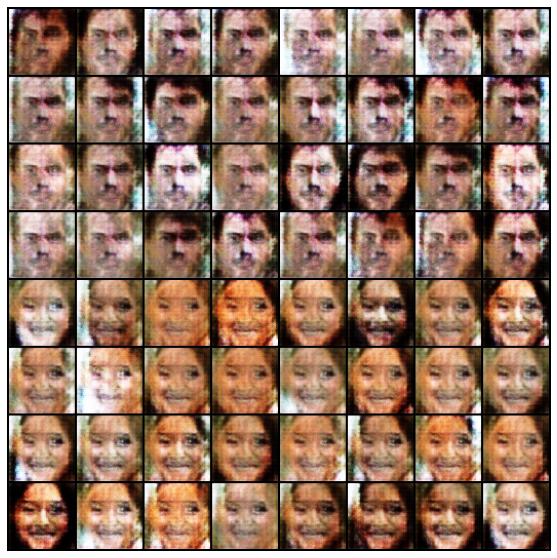

EPOCH: 4.000	d_loss: 0.468	g_loss: 4.839	(162.40s - 852.58s remaining))


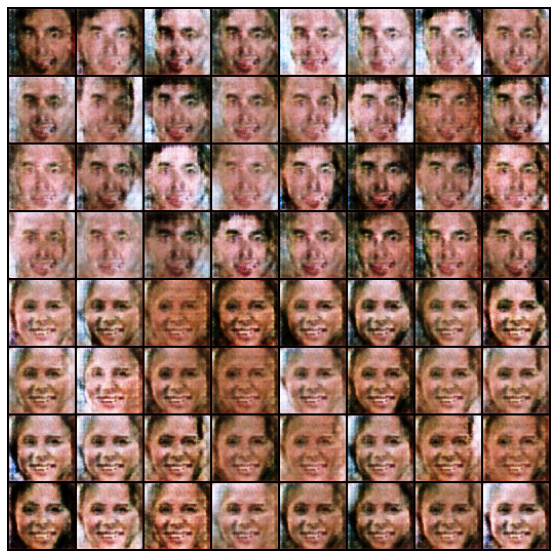

EPOCH: 5.000	d_loss: 0.457	g_loss: 5.133	(204.88s - 819.54s remaining))


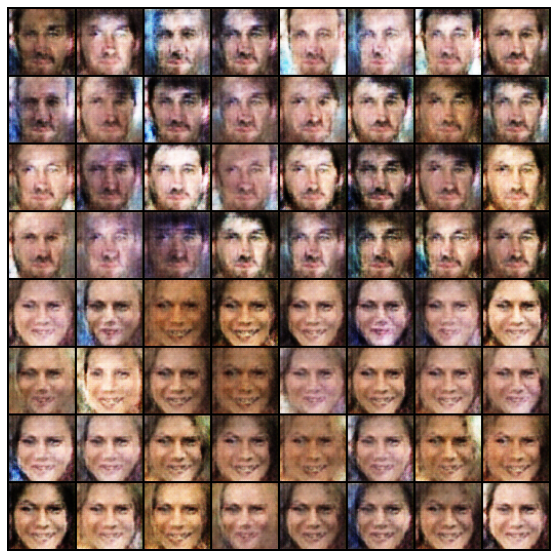

EPOCH: 6.000	d_loss: 0.494	g_loss: 5.164	(247.03s - 782.27s remaining))


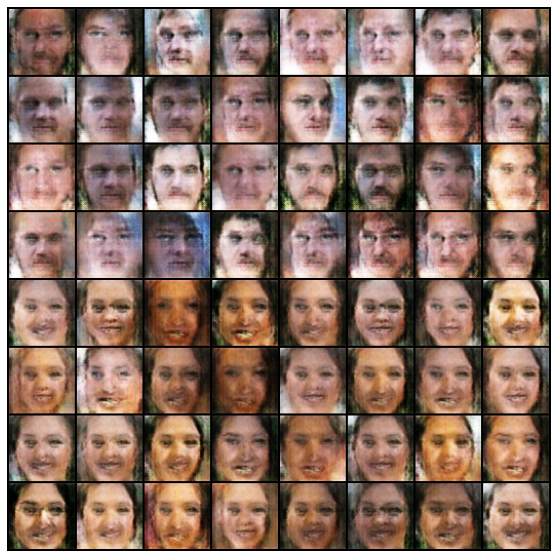

EPOCH: 7.000	d_loss: 0.500	g_loss: 4.890	(289.11s - 743.44s remaining))


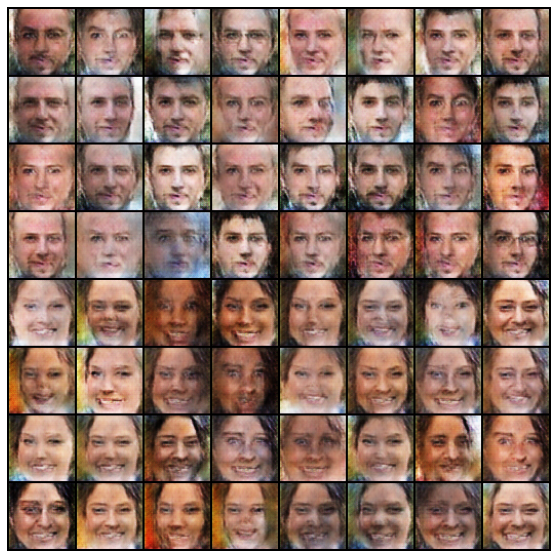

EPOCH: 8.000	d_loss: 0.518	g_loss: 4.723	(331.26s - 703.92s remaining)


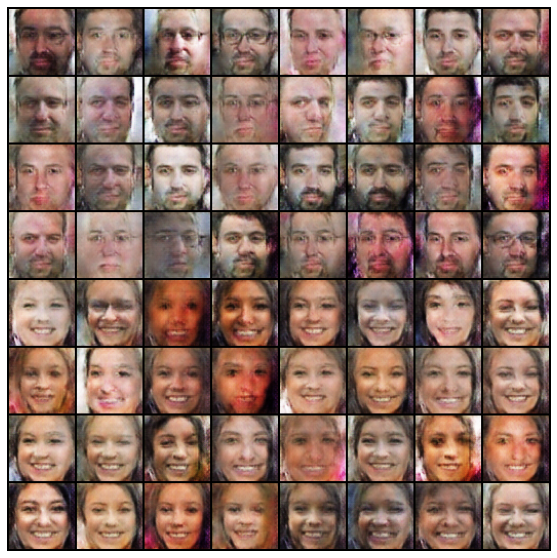

EPOCH: 9.000	d_loss: 0.494	g_loss: 4.517	(373.38s - 663.79s remaining))


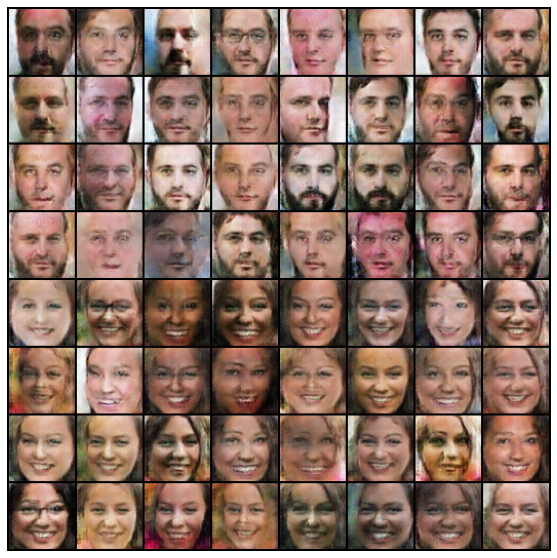

EPOCH: 10.000	d_loss: 0.508	g_loss: 4.314	(415.49s - 623.24s remaining)


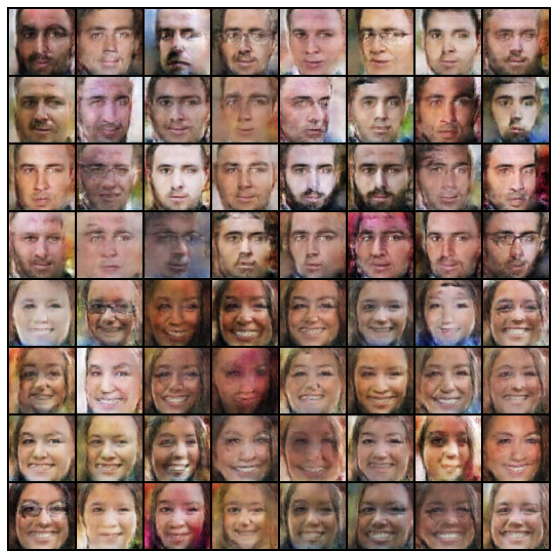

EPOCH: 11.000	d_loss: 0.505	g_loss: 4.168	(457.65s - 582.47s remaining))


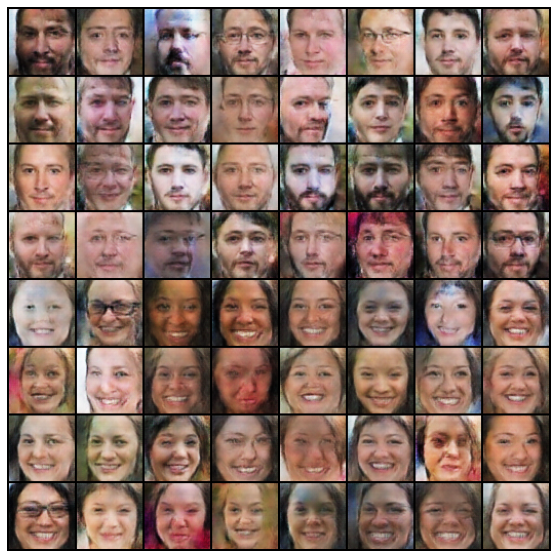

EPOCH: 12.000	d_loss: 0.515	g_loss: 4.183	(499.80s - 541.45s remaining))


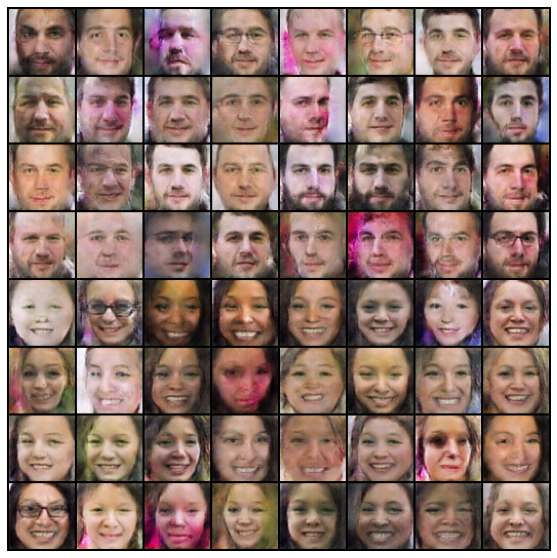

EPOCH: 13.000	d_loss: 0.474	g_loss: 4.208	(542.45s - 500.73s remaining))


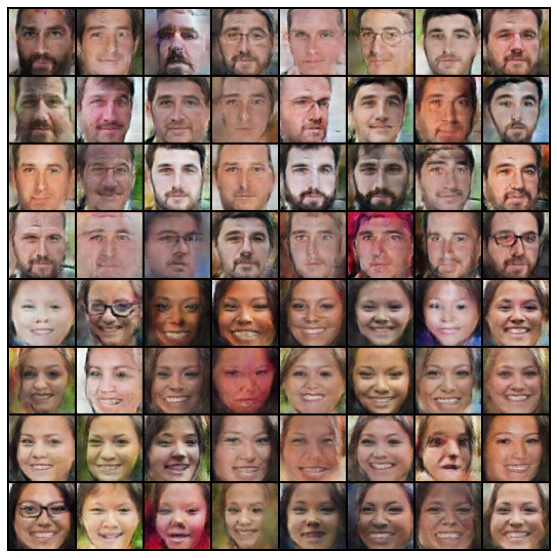

EPOCH: 14.000	d_loss: 0.470	g_loss: 4.099	(588.23s - 462.18s remaining)


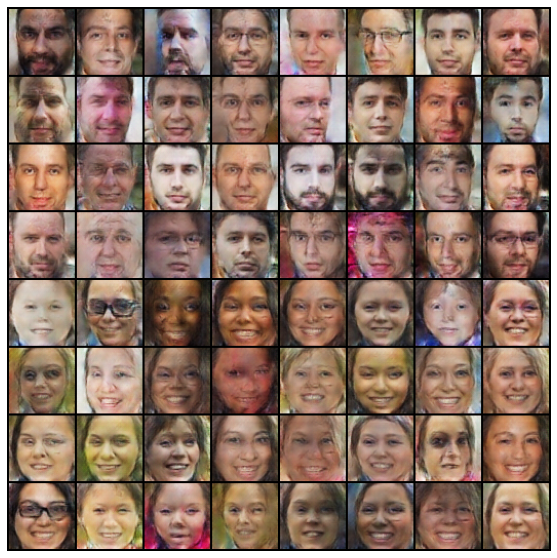

EPOCH: 15.000	d_loss: 0.480	g_loss: 4.169	(633.66s - 422.44s remaining))


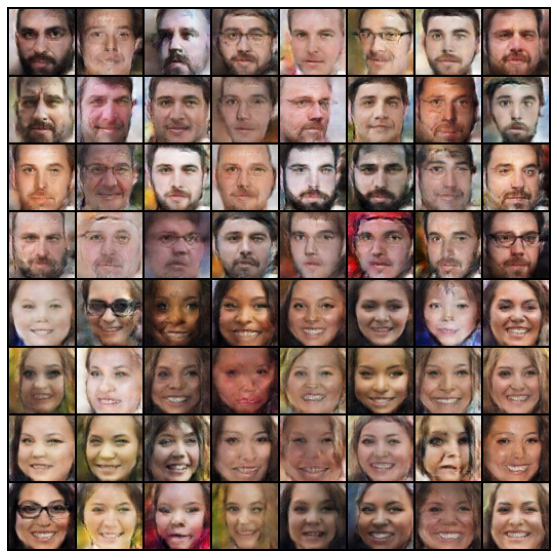

EPOCH: 16.000	d_loss: 0.453	g_loss: 4.211	(676.93s - 380.77s remaining))


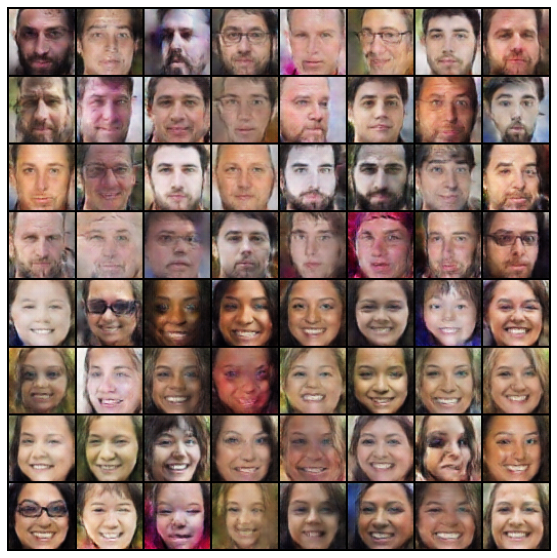

EPOCH: 17.000	d_loss: 0.422	g_loss: 4.235	(719.20s - 338.44s remaining))


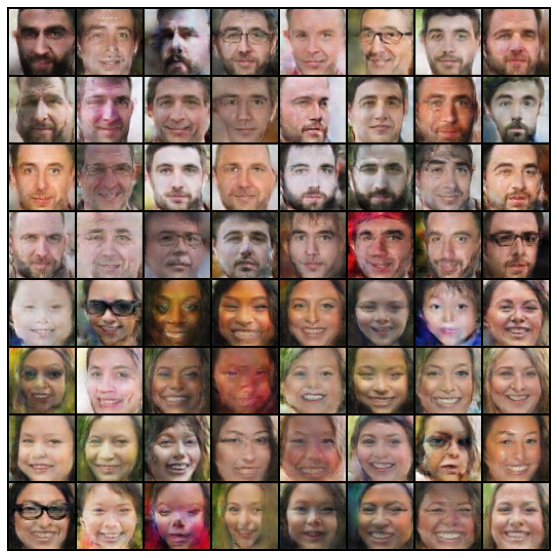

EPOCH: 18.000	d_loss: 0.438	g_loss: 4.412	(761.52s - 296.15s remaining))


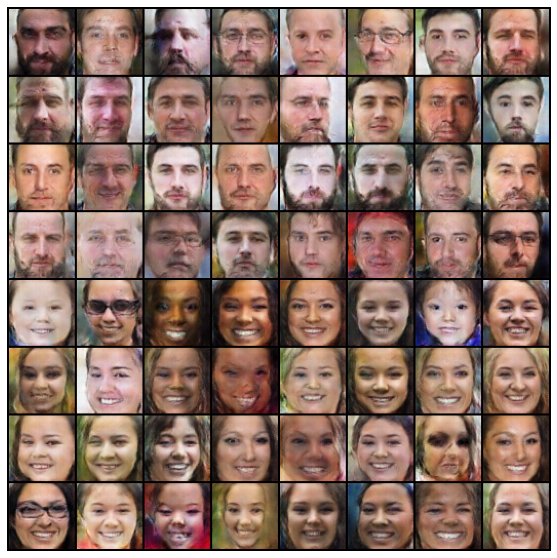

EPOCH: 19.000	d_loss: 0.377	g_loss: 4.409	(803.71s - 253.80s remaining))


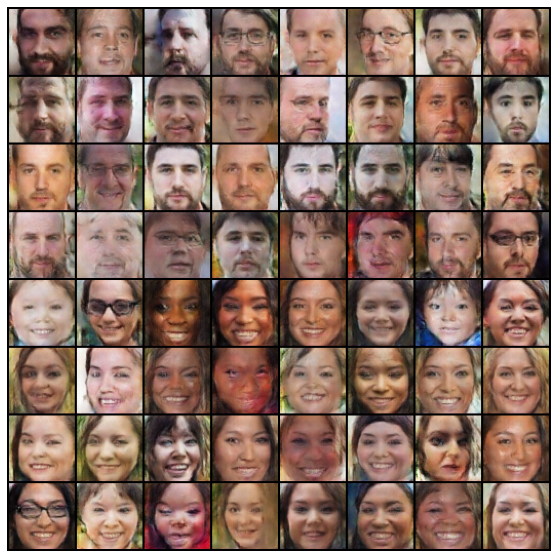

EPOCH: 20.000	d_loss: 0.394	g_loss: 4.405	(845.95s - 211.49s remaining))


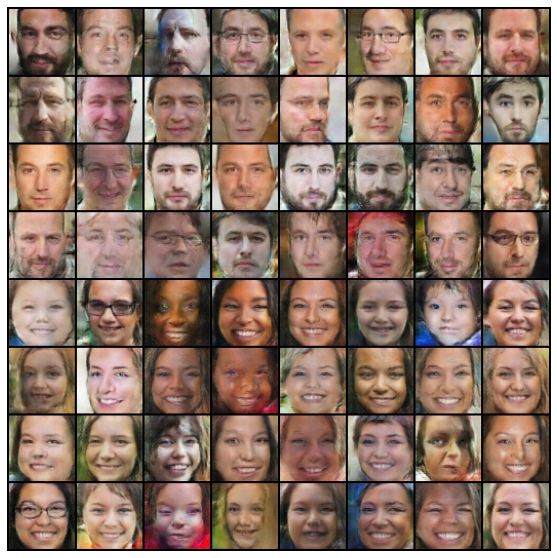

EPOCH: 21.000	d_loss: 0.369	g_loss: 4.486	(888.22s - 169.18s remaining))


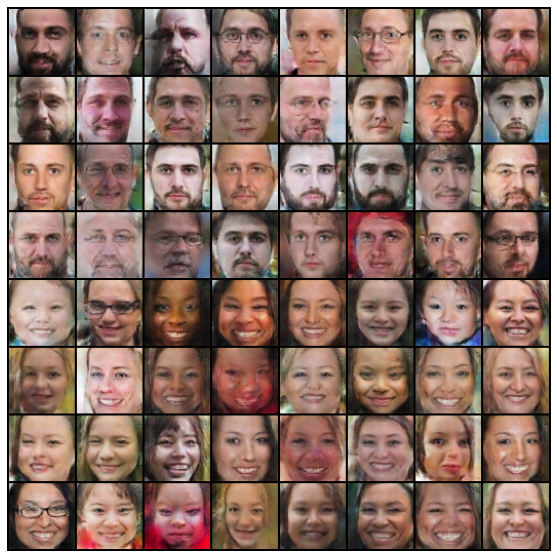

EPOCH: 22.000	d_loss: 0.422	g_loss: 4.367	(930.45s - 126.88s remaining))


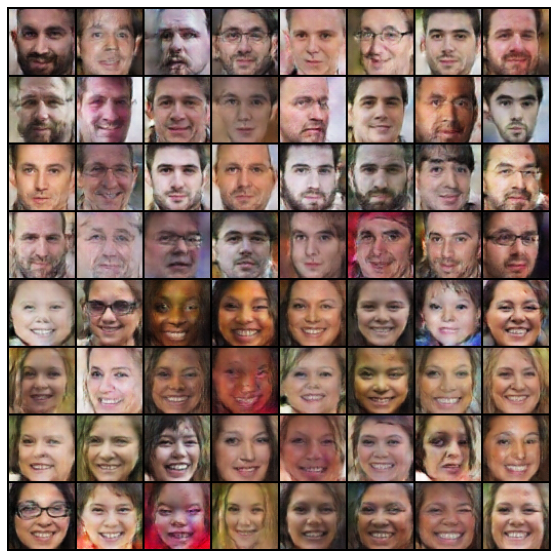

EPOCH: 23.000	d_loss: 0.353	g_loss: 4.497	(972.74s - 84.59s remaining)))


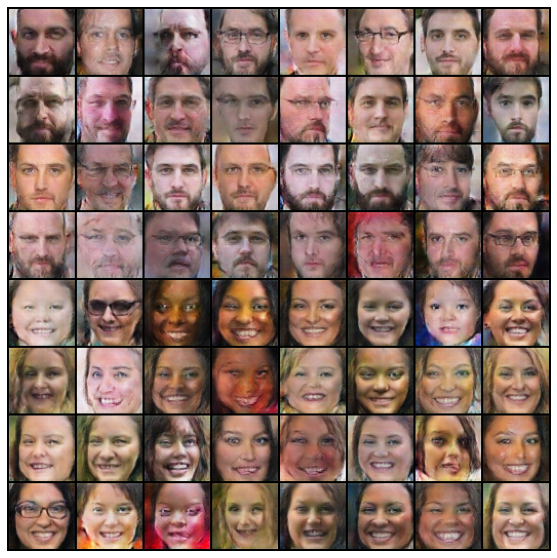

EPOCH: 24.000	d_loss: 0.373	g_loss: 4.599	(1014.98s - 42.29s remaining))


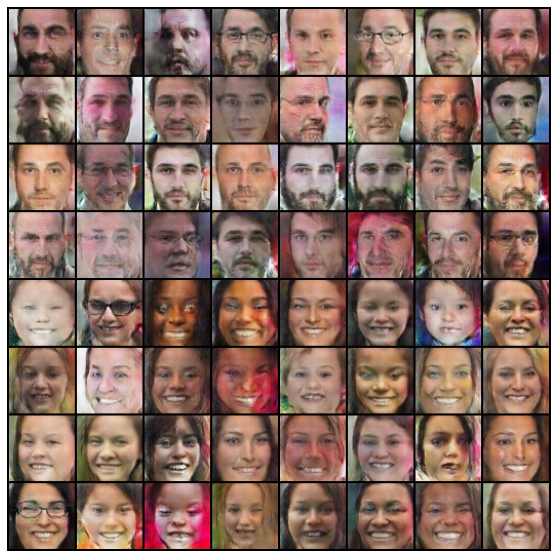

EPOCH: 25.000	d_loss: 0.292	g_loss: 4.745	(1057.22s - 0.00s remaining))


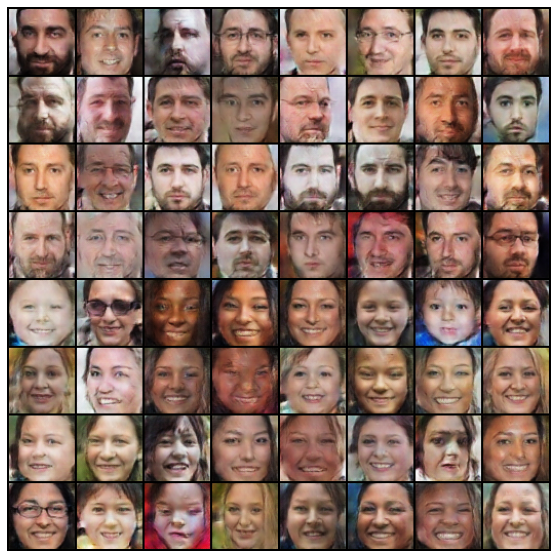

In [19]:
log = Report(n_epochs)
for epoch in range(n_epochs):
    N = len(dataloader)
    for bx, (images, labels) in enumerate(dataloader):
        real_data, real_labels = images.to(device), labels.to(device)
        fake_labels = torch.LongTensor(np.random.randint(0, 2, len(real_data))).to(device)
        fake_data = generator(noise(len(real_data)), fake_labels)
        fake_data = fake_data.detach()
        d_loss = discriminator_train_step(real_data, real_labels, fake_data, fake_labels)
        fake_labels = torch.LongTensor(np.random.randint(0, 2, len(real_data))).to(device)
        fake_data = generator(noise(len(real_data)), fake_labels).to(device)
        g_loss = generator_train_step(fake_data, fake_labels)
        pos = epoch + (1+bx)/N
        log.record(pos, d_loss=d_loss.detach(), g_loss=g_loss.detach(), end='\r')
    log.report_avgs(epoch+1)
    with torch.no_grad():
        fake = generator(fixed_noise, fixed_fake_labels).detach().cpu()
        imgs = vutils.make_grid(fake, padding=2, normalize=True).permute(1,2,0)
        img_list.append(imgs)
        show(imgs, sz=10)